In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import OneHotEncoder
from feature_engine.categorical_encoders import RareLabelCategoricalEncoder
from sklearn import preprocessing
from mpl_toolkits import mplot3d
%matplotlib inline
from geopy import geocoders 
from geopy.geocoders import Nominatim
import plotly.graph_objects as go
import plotly.express as px
from PIL import Image
from collections import Counter
from wordcloud import WordCloud, STOPWORDS

In [2]:
pd.set_option('display.max_columns', None)

In [3]:
data = pd.read_csv('data.csv')
data_le = pd.read_csv('data_le.csv')
data.rename(columns={'tramsmission':'transmission'}, inplace=True)
data.drop('Unnamed: 0', axis=1, inplace=True)
data_le.drop('Unnamed: 0', axis=1, inplace=True)

# Pairplot to mapping corelation between each features

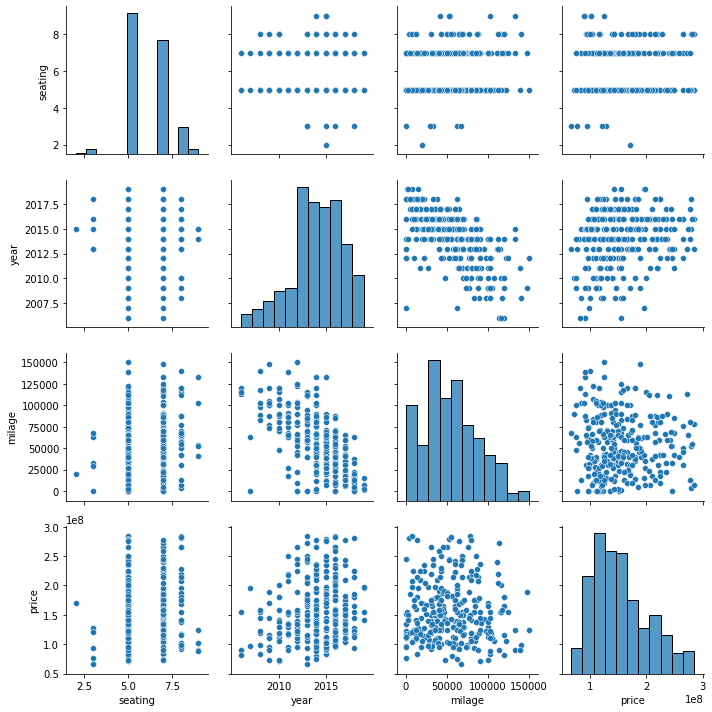

<Figure size 432x288 with 0 Axes>

In [4]:
sns.pairplot(data.sample(300))
plt.tight_layout()
plt.show()
plt.savefig('pairplot-used-car',dpi=60)

From the pairplot of 300 sample data above we can map the correlation and distribution of each feature of the data.
1. price-seating : 5 and 6 seating have most distribution from low to hight price
2. price-year : oldest car tends to have low price , distribution of price are centered around 2010 to 2015
3. price-milage : higher milage tend to have low price
4. seating-milage : this plot almost same as price-seating plot which can be concluded that 5-6 seating have mostly frequent occurance in the dataset
5. year-milage : the oldest car have higher milage 



# Distribution of Price

C:\Users\tab\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


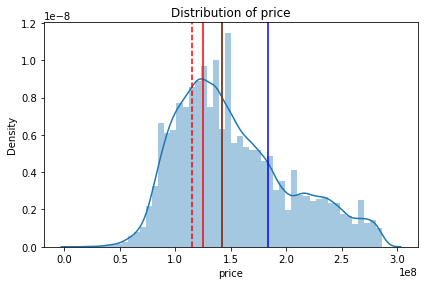

In [5]:
sns.distplot(data.price).get_lines()[0].get_data()
ser = data.price

Q1=np.percentile(ser, 25) 
Q2=np.percentile(ser, 50)  
Q3=np.percentile(ser, 75)

plt.axvline(Q1, color='r', linestyle='--')
plt.axvline(Q2, color='g', linestyle='-')
plt.axvline(Q3, color='b', linestyle='-')
#plt.axvline(ser.mean(), color='magenta')
plt.axvline(ser.median(), color='brown')
plt.axvline(ser.mode().values, color='red')

plt.tight_layout()
plt.title("Distribution of price")
plt.savefig('price-distribution',dpi=60)
plt.show()

From the graph, we know that used car's price are highly distributed in the number of 100 Million until 150 Million. Price bellow 50 Million and above 2.5 Billiion are mostly rare.

# 10 Most Frequent Item in each feature in dataset

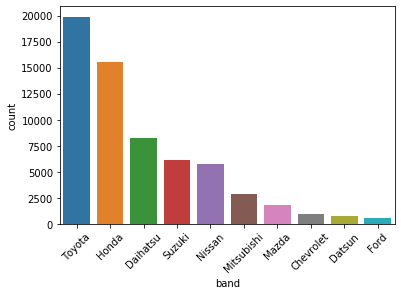

In [6]:
plot = sns.countplot(x = 'band',data = data,order = data['band'].value_counts().head(10).index)
plt.xticks(rotation=45)
plt.savefig('10-most-band',dpi=60)

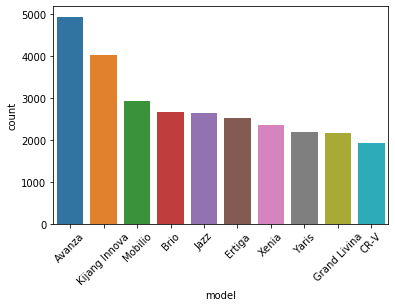

In [7]:
plot = sns.countplot(x = 'model',data = data,order = data['model'].value_counts().head(10).index)
plt.xticks(rotation=45)
plt.savefig('10-most-model',dpi=60)

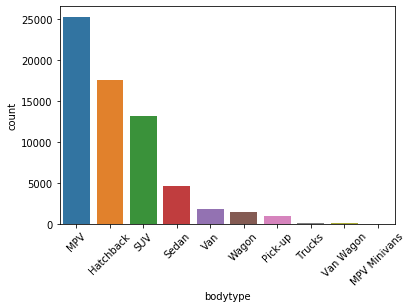

In [8]:
plot = sns.countplot(x = 'bodytype',data = data,order = data['bodytype'].value_counts().head(10).index)
plt.xticks(rotation=45)
plt.savefig('10-most-bodytype',dpi=60)

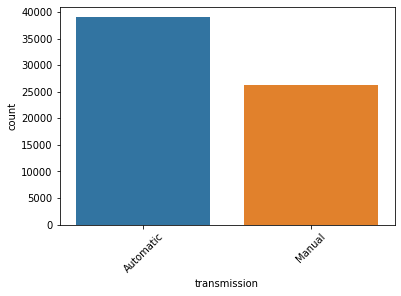

In [9]:
plot = sns.countplot(x = 'transmission',data = data,order = data['transmission'].value_counts().head(10).index)
plt.xticks(rotation=45)
plt.savefig('10-most-transmission',dpi=60)

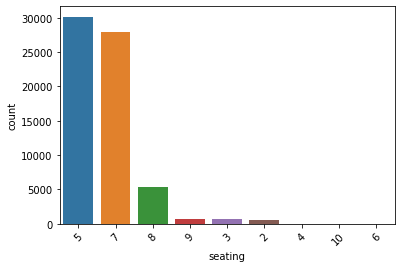

In [10]:
plot = sns.countplot(x = 'seating',data = data,order = data['seating'].value_counts().head(10).index)
plt.xticks(rotation=45)
plt.savefig('10-most-seatings',dpi=60)

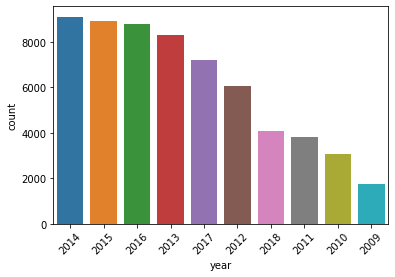

In [11]:
plot = sns.countplot(x = 'year',data = data,order = data['year'].value_counts().head(10).index)
plt.xticks(rotation=45)
plt.savefig('10-most-year',dpi=60)

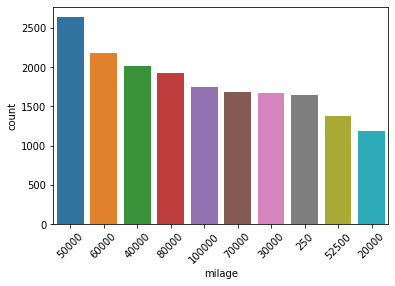

In [12]:
plot = sns.countplot(x = 'milage',data = data,order = data['milage'].value_counts().head(10).index)
plt.xticks(rotation=45)
plt.savefig('10-most-milage',dpi=60)

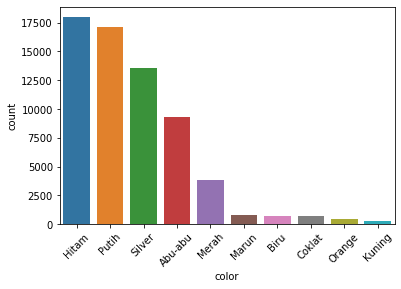

In [13]:
plot = sns.countplot(x = 'color',data = data,order = data['color'].value_counts().head(10).index)
plt.xticks(rotation=45)
plt.savefig('10-most-color',dpi=60)

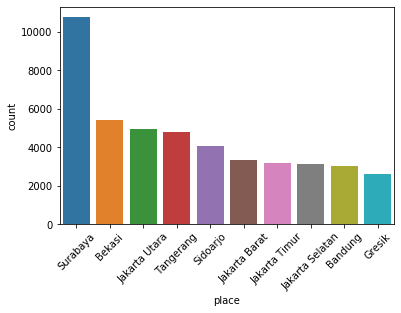

In [14]:
plot = sns.countplot(x = 'place',data = data,order = data['place'].value_counts().head(10).index)
plt.xticks(rotation=45)
plt.savefig('10-most-place',dpi=60)

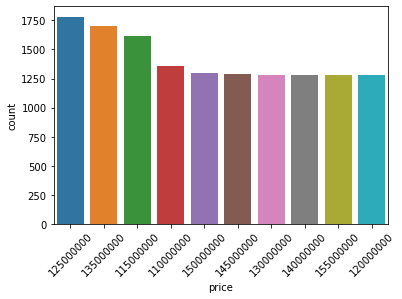

In [15]:
plot = sns.countplot(x = 'price',data = data,order = data['price'].value_counts().head(10).index)
plt.xticks(rotation=45)
plt.savefig('10-most-price',dpi=60)

# List of percentage car's bands 

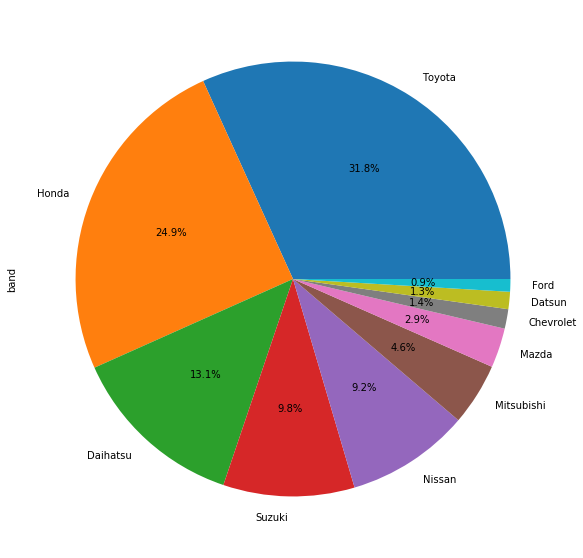

In [16]:
data['band'].explode().value_counts().head(10).plot.pie(figsize=(12,10), autopct='%1.1f%%')

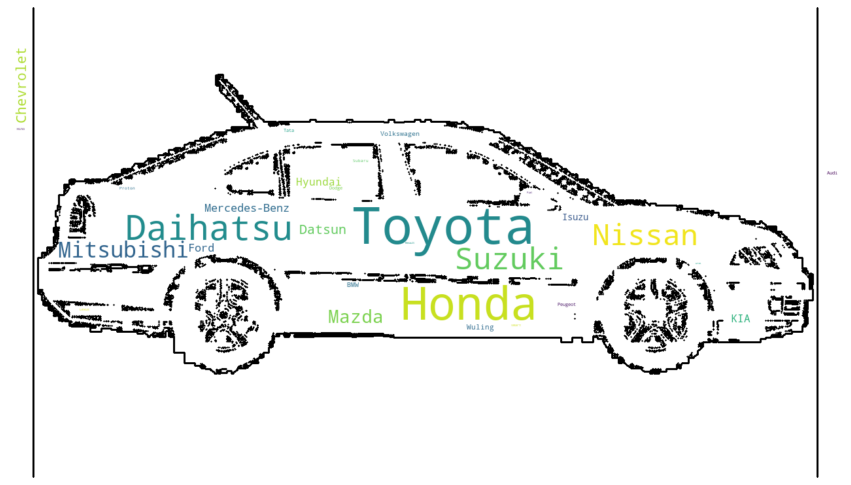

In [17]:
#Some fun Visualizations 
freqs = Counter(data['band'])
df = pd.DataFrame.from_dict(freqs, orient='index').reset_index()
df.columns = ['brands','freqs']
car_mask = np.array(Image.open(r'C:\Users\tab\Desktop\Modul 3\tugas akhir\car.jpg'))
wc = WordCloud(background_color="white", max_words=1000, mask=car_mask,contour_width=2,contour_color='black')
wc.generate_from_frequencies(freqs)
plt.figure(figsize=(15, 15))
plt.axis("off")
make = data_le.groupby(['band']).count().sort_values(by='band',ascending=False).reset_index()
plt.savefig('wordcloudcar.png')
plt.imshow(wc, interpolation='bilinear');

# List of Car's model compared by other model grouped by their band 

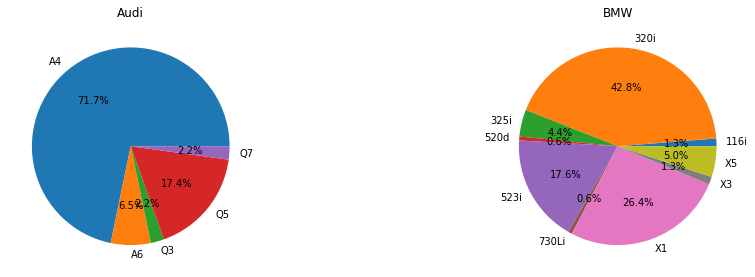

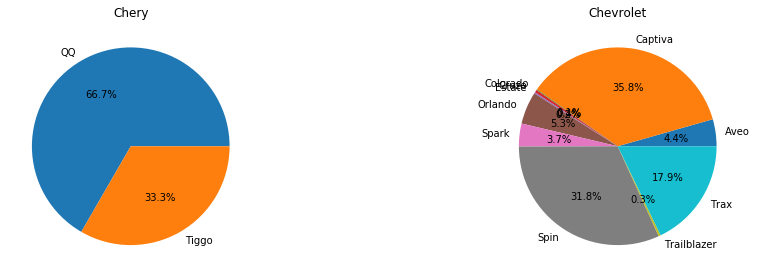

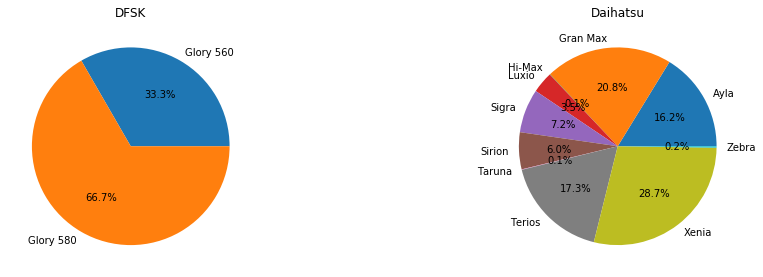

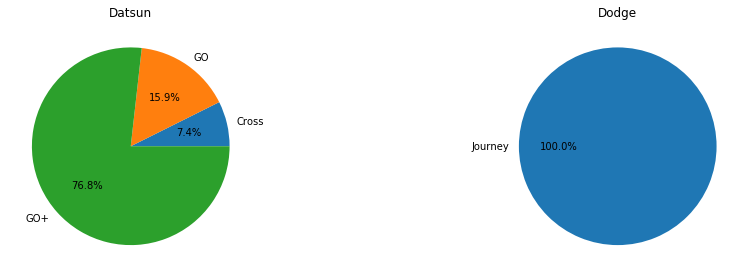

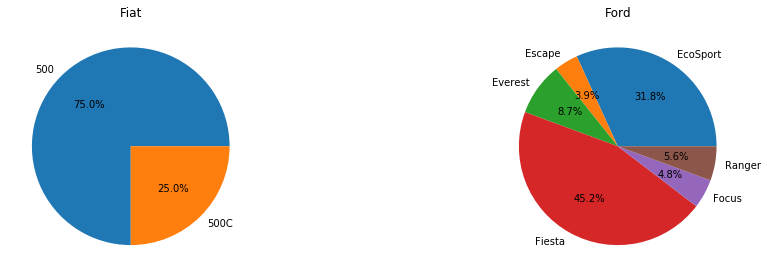

...

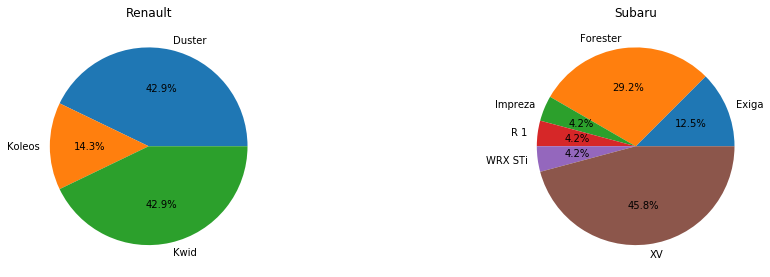

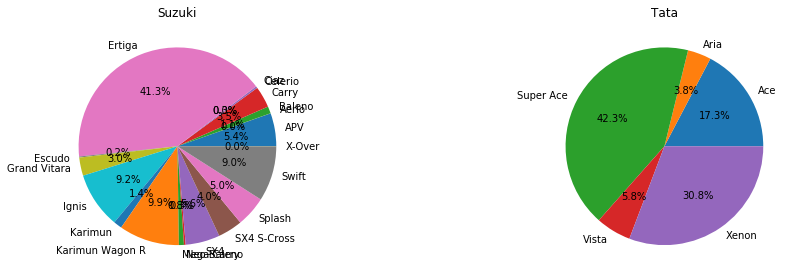

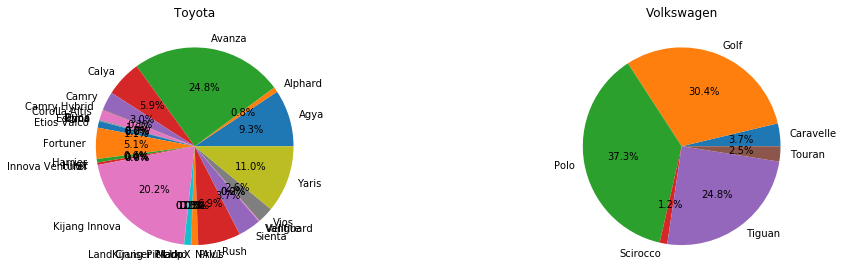

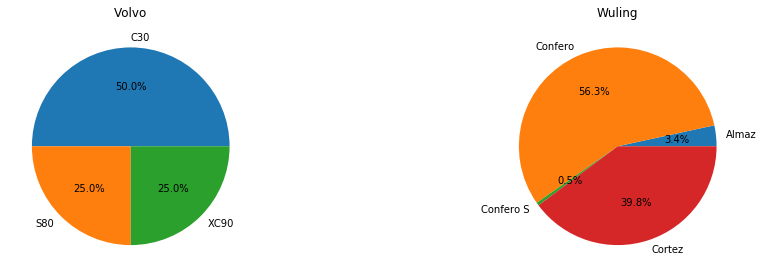

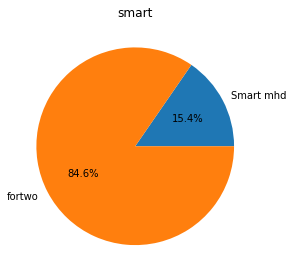

In [18]:
bl = data.groupby(['band', 'model']).size().reset_index()
bl.rename(columns={0:'counted'}, inplace=True)
x = 0
y = 221 
for v in bl.band.unique() :
    acd = bl[bl['band'] == v]
    bk = acd.model.tolist()
    ck = acd.counted.tolist()
    if (x % 2) == 0:
        plt.figure(figsize=(16,10))
        y=221
        plt.subplot(y)
        y+=1
    else:
        plt.subplot(y)
        y+=1
    plt.title(v)
    plt.pie(ck, labels = bk, autopct='%1.1f%%')
    plt.show
    plt.savefig('modelperband',dpi=60)
    x+=1   

# Car's Band Average Prices

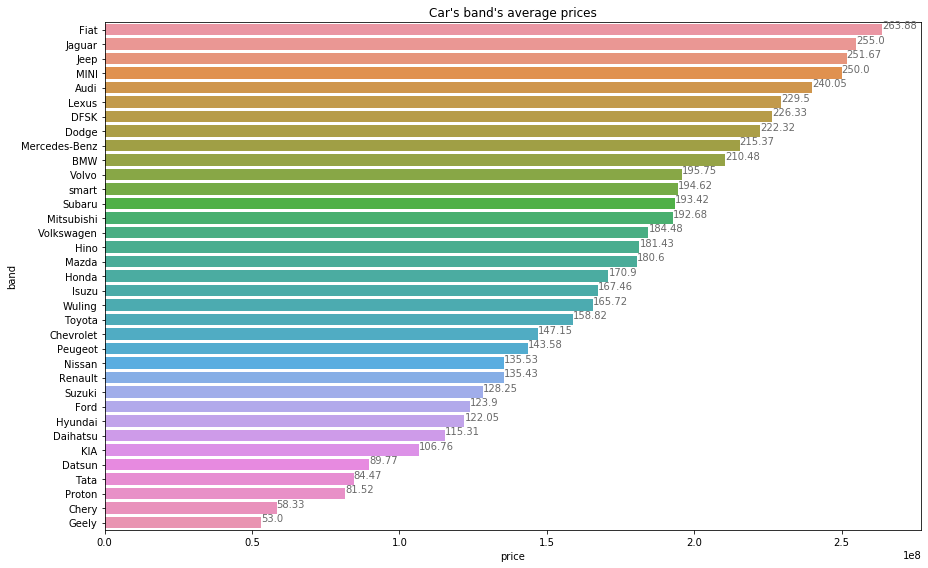

In [19]:
dm = data.groupby('band')['price'].mean()
dm = dm.reset_index()
f, ax = plt.subplots(figsize=(13,8))

gg =sns.barplot(x='price' , y='band', data=dm.sort_values('price',ascending=False), orient="h") 
for p in gg.patches:
    gg.text(p.get_width()+.1, p.get_y()+.31, \
            str(round((p.get_width())/1000000, 2)), fontsize=10, color='dimgrey')
plt.title("Car's band's average prices")
plt.savefig('car-average-price',dpi=60)
plt.tight_layout()

We can see through graph that Flat, Elf, Jaguar, and Jeep have the most stable average price than other band. It is interesting, that the other luxury brand like Mercedes-Bench, Land Rover, and BMW have price which are bellow Elf and Jeep. It indicates that used cars price is not necessary balanced as new car. Some new cars band might be more expensive but aftersales could drop their price quickly than other car. For better understanding we could explore models feature with the bellow graph.

# Car's Models Averages Prices

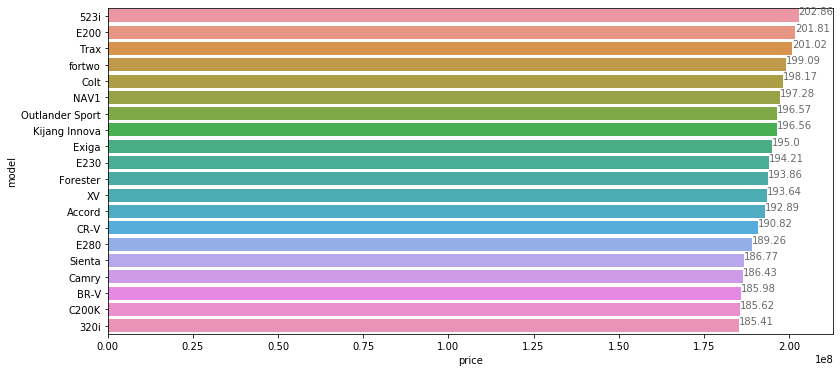

In [20]:
dx = data.groupby('model')['price'].mean()
dx = dx.reset_index().sort_values('price', ascending=False)[80:100]
f, ax = plt.subplots(figsize=(13,6))
gg =sns.barplot(x='price' , y='model', data=dx, orient="h")
plt.savefig('model-average-price',dpi=60)
for p in gg.patches:
    gg.text(p.get_width()+.1, p.get_y()+.31, \
        str(round((p.get_width())/1000000, 2)), fontsize=10, color='dimgrey')

Now we can see more clearly that even new CR-V which have price between Rp 467,9 Million have average used price that dropped to be around 189 Million while new Kijang Innova which have price  326 Million had only dropped to be 194 Million. 

# Averages price by the year of production

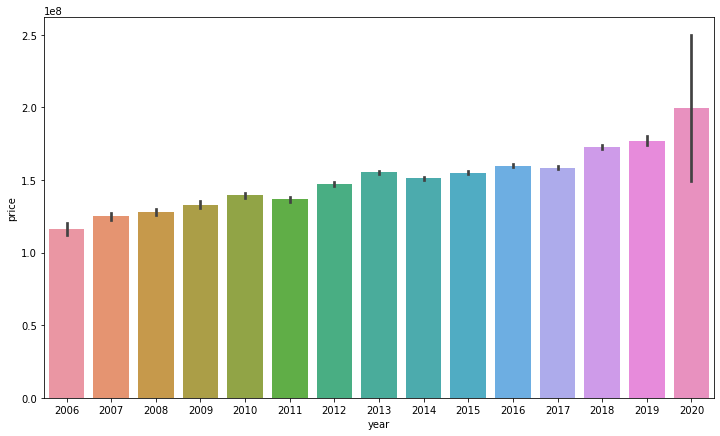

In [21]:
plt.figure(figsize=(12,7))
sns.barplot(x='year',y='price',data=data)
plt.savefig('year-average-price',dpi=60)

As expected that vehicle's average price inscreasing while the years are newer with exception in 2013 produced car have higher price than 2014 and 2015 car, We can see the reason in the graph bellow.

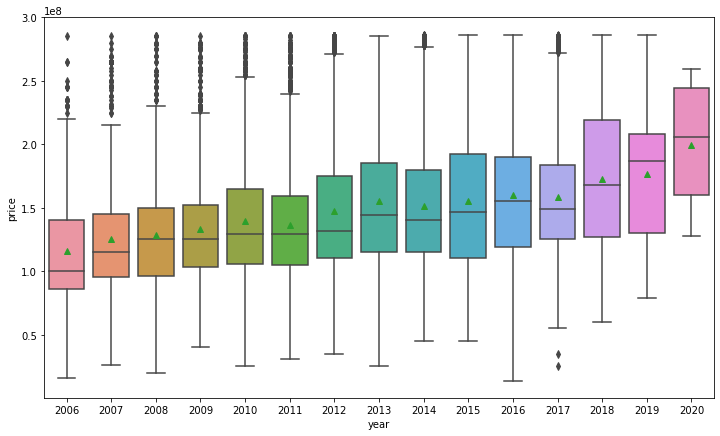

In [22]:
plt.figure(figsize=(12,7))
sns.boxplot(x='year', y = 'price' ,data=data,showfliers=True,showmeans=True)

We could see in the above graph that year's price ascending every year of car, except for 2013 vehicle have high number of price between q3, q1, or we can say that 2013 vehicle is distributed evenly than 2014 and 2015 vehicle. Overall 2018 car have many variated price than another years.

# Average prices by the seating numbers

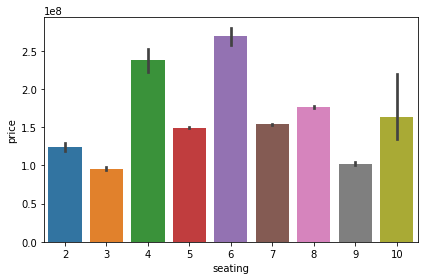

<Figure size 432x288 with 0 Axes>

In [23]:
sns.barplot(x='seating',y='price',data=data)
plt.tight_layout()
plt.show()
plt.savefig('car-seating-price',dpi=60)

Vehicle with 6, and 4 seating have the highest average price, and vehicle with 2 , 3 , and 9 seating have the lowest average price. Vehicle with 10 seatings are usually minibus. 4, and 10 seatings have lower price because that numbers have more variated price and model which afected whole price on averages. About vehicle with 2 seatings are mostly supercar but also including pickup, and truck, pickup and truck usually have low price which is why affected whole 2 seating vehicle's average price..

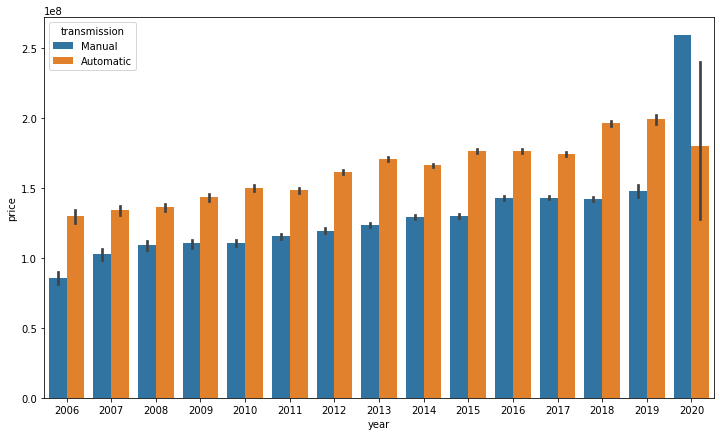

In [24]:
plt.figure(figsize=(12,7))
sns.barplot(x='year',y='price', hue= 'transmission',data=data)

From the graph we could see that automatic transmission generally have more price than manual, except for 2020's vehicle

# Average prices by the type of transmision

<Figure size 720x360 with 0 Axes>

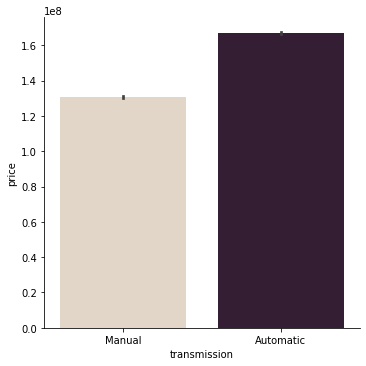

In [25]:
plt.figure(figsize=(10,5))
sns.catplot(x="transmission", y="price",kind="bar", palette="ch:.25", data=data)
plt.savefig('car-transmission-price',dpi=60)

Automatic Vehicle have average price 166 Million and Manual have average price only 130 Million, so automatic generally have 43 Million more price than manual.

# Correlation between car's milage and car's price

<Figure size 864x504 with 0 Axes>

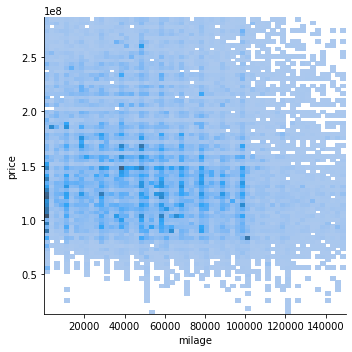

In [26]:
plt.figure(figsize=(12,7))
sns.displot(x=data["milage"], y=data["price"])
plt.savefig('car-milage-price',dpi=60)

As expected that vehicle's average price declining while the milage is increasing, we could see in the plot that the more milage increase the lesser the blue pixcels in the plot . We can see correlation with a year using ploting 3d bellow

# 3D Plot to visualize correlation between car's milage, year of production and car's prices

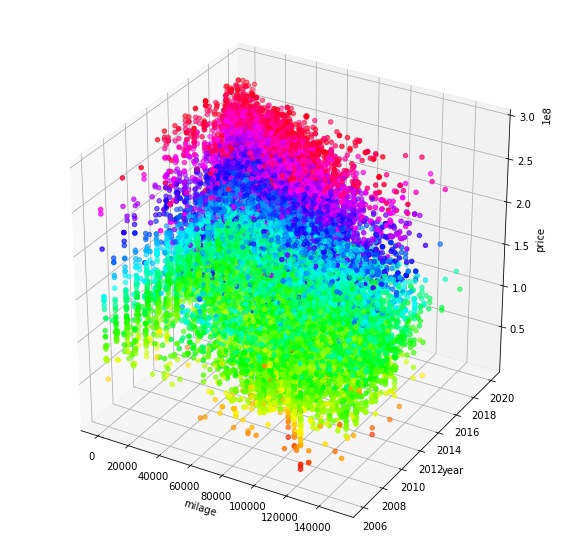

In [27]:

fig = plt.figure(figsize=(10,10))
ax = plt.axes(projection="3d")

z_points = data['price']
x_points = data['milage']
y_points = data['year']
ax.scatter3D(x_points, y_points, z_points, c=z_points, cmap='hsv');

ax.set_xlabel('milage')
ax.set_ylabel('year')
ax.set_zlabel('price')

plt.show()

From the 3d plot we could see that highest milage and oldest car typically have lower price than lower milage and newer car.

# Average prices by car's bodytypes

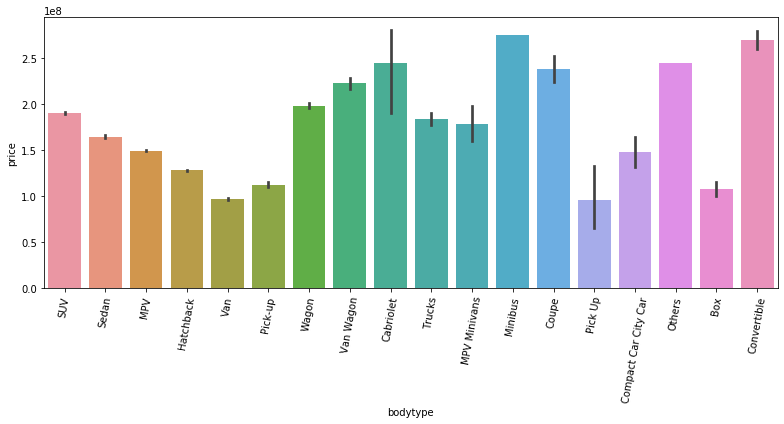

In [28]:
plt.figure(figsize=(11,6))
sns.barplot(x='bodytype',y='price',data=data)
plt.xticks(rotation=80)
plt.tight_layout()
plt.show()

As expected, Chabriolette and convertible are the most valued body type because those type are belong to supercar body. Family car's bodytype such as Hatchback generally have lower value.

# Correlation between car's color and car's bodytype

In [29]:
x = data.bodytype
y = data.color
fig = go.Figure(go.Histogram2d(
        x=x,
        y=y
    ))
fig.show()
plt.savefig('car-color-bt-price',dpi=60)

<Figure size 432x288 with 0 Axes>

From the plot above we can see that MPV bodytype has highly correlated with white, black, and silver color. So do SUV and Hatchback with but with less frequent, other bodytype typically not specificated with any certain color.

# Average prices by car's fueltypes

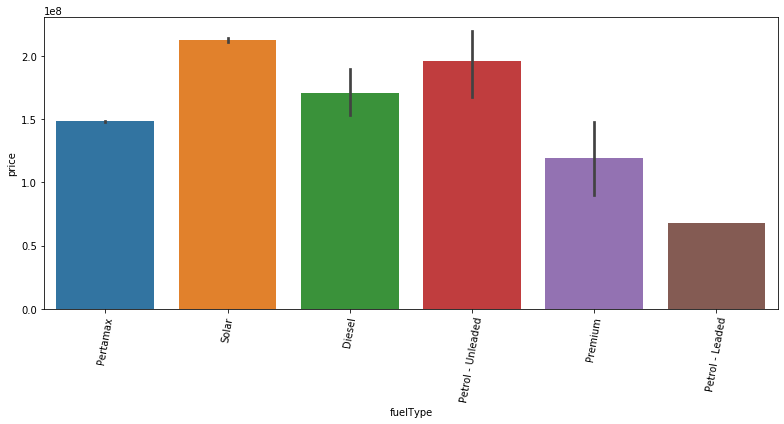

In [30]:
plt.figure(figsize=(11,6))
sns.barplot(x='fuelType',y='price',data=data)
plt.xticks(rotation=80)
plt.tight_layout()
plt.show()

In [31]:
dx = data.groupby('place')['price'].mean().head(60)
dx = dx.reset_index().sort_values('price', ascending=False)
dx

,place,price
24,Belu,2.400000e+08
10,Bangli,2.150000e+08
4,Bali,2.145625e+08
55,Gorontalo,2.071667e+08
56,Gorontalo Utara,1.975000e+08
54,Gianyar,1.940000e+08
29,Bima,1.840000e+08
26,Bengkayang,1.840000e+08
40,Ciamis,1.838333e+08
5,Balikpapan,1.812308e+08


# Average prices by car's locations

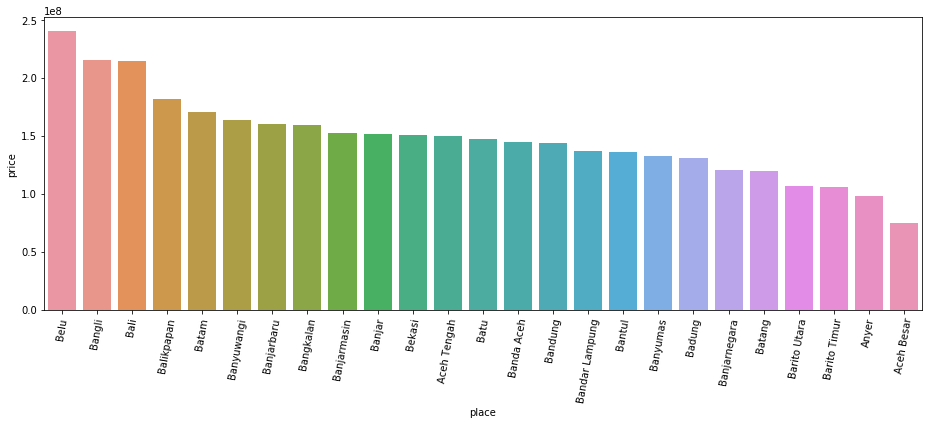

In [32]:
dx = data.groupby('place')['price'].mean().head(25)
dx = dx.reset_index().sort_values('price', ascending=False)
f, ax = plt.subplots(figsize=(13,6))
sns.barplot(x='place',y='price',data=dx)
plt.xticks(rotation=80)
plt.tight_layout()
plt.show()

It's interesting that big cities like Jakarta and Surabaya are not among the top 10 cities with the best average prices. But Belu is followed by Balikpapan and Batam has the highest average price. This is due to the fact that price competition in big cities is tougher so that many sellers have lowered their prices.

# Plot average car prices by car's place on the map

In [33]:
city_name = data['place'].unique().tolist()
latlis = []
for city in city_name :
    l = []
    address=city
    geolocator = Nominatim(user_agent="abc")
    location = geolocator.geocode(address)
    l.append(city)
    if hasattr(location,'latitude') and (location.latitude is not None):
        l.append(location.latitude)
    if hasattr(location,'longitude') and (location.longitude is not None):
        l.append(location.longitude)
    latlis.append(l)
b = pd.DataFrame.from_records(latlis).drop(0).rename(columns={0 :'place', 1:'lat', 2:'long'})
data = data.merge(b, on='place', how='left')
data.loc[data.place == 'Surabaya', 'lat'] = -7.245972
data.loc[data.place == 'Surabaya', 'long'] = 112.7378266

data.loc[data.place == 'Wonogiri', 'lat'] = -7.797852
data.loc[data.place == 'Wonogiri', 'long'] = 110.938742

data.loc[data.place == 'Kota Waringin Barat', 'lat'] =  -2.6865269
data.loc[data.place == 'Kota Waringin Barat', 'long'] = 111.629247


data.loc[data.place == 'Kabupaten Merauke', 'lat'] =  -8.499112
data.loc[data.place == 'Kabupaten Merauke', 'long'] = 140.404984

data.loc[data.place == 'Ogam Komreing Ilir', 'lat'] =  -3.4559744
data.loc[data.place == 'Ogam Komreing Ilir', 'long'] = 105.2194808

In [34]:
datax = data.groupby('place')['price'].mean().reset_index()
datax.price = datax.price.astype(int)
datax = datax.merge(data[['lat', 'long', 'place']], on='place', how='left')
datax.loc[datax.place == 'Surabaya', 'lat'] = -7.245972
datax.loc[datax.place == 'Surabaya', 'long'] = 112.7378266
fig = px.scatter_mapbox(datax, lat="lat", lon="long",  hover_data=["price", 'place'],
                        color_discrete_sequence=["red"], zoom=4, height=800)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
plt.savefig('map',dpi=60)
fig.show()

<Figure size 432x288 with 0 Axes>

# Correlation table using heatmap

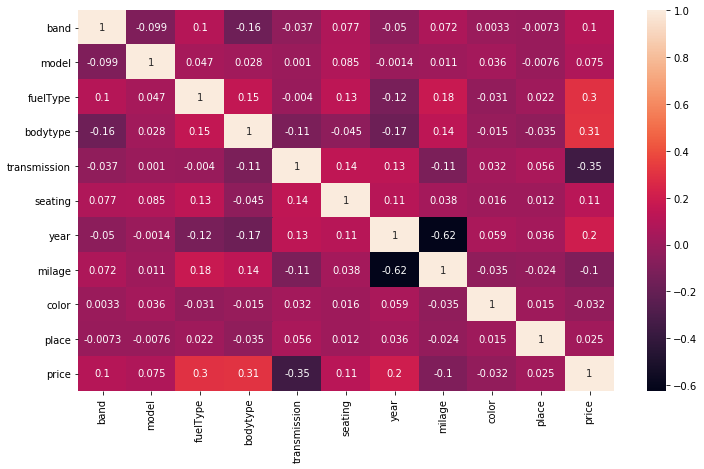

In [35]:
plt.figure(figsize=(12,7))
sns.heatmap(data_le.corr(method='pearson'), annot=True)

Correlation between all features are generally lower than correlation between each features with prices, in this case this dataset could safely be said far from  collinearity problem. Many correlation have negative values which indicates if the corrleation is opposite such as the higher the milage tend to make the price to be lower.